In [1]:
!pip install -q segmentation-models-pytorch

import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

In [2]:
torch.cuda.empty_cache()

In [3]:
torch.cuda.set_per_process_memory_fraction(0.75, device=0)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
torch.cuda.get_device_name()

'Tesla P100-PCIE-16GB'

In [6]:
torch.cuda.get_device_capability()

(6, 0)

In [7]:
files_dir = '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')

In [8]:
csv_path = '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/data.csv'
MRI_data = pd.read_csv(csv_path)

MRI_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [9]:
imputer = SimpleImputer(strategy="most_frequent")

MRI_data = pd.DataFrame(imputer.fit_transform(MRI_data), columns = MRI_data.columns)
MRI_data

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,2.0,0.0
3,TCGA_CS_4944,2.0,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,2.0,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,2.0,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,2.0,5.0,2,1.0,2.0,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,2.0,5.0,2,1.0,2.0,2.0,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


In [10]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)
    
    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments
    
    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [11]:
get_file_row('/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif')

['TCGA_DU_7010',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif']

In [12]:
Filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
Filenames_df

,Patient,image_filename,mask_filename
0,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
1,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
2,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
4,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
...,...,...,...
3924,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3925,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3926,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3927,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...


In [13]:
class MriDataset(Dataset):
    def __init__(self, MRI_data, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = MRI_data
        self.transform = transform
        self.mean = mean
        self.std = std
        
        
    def __len__(self):
        return len(self.df)
        
    def __getitem__(self, idx, raw=False):
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask
        
        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        
        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [14]:
df = pd.merge(MRI_data, Filenames_df, on="Patient")

In [15]:
df.head()

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01,image_filename,mask_filename
0,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
1,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
2,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
4,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Patient                    3929 non-null   object
 1   RNASeqCluster              3929 non-null   object
 2   MethylationCluster         3929 non-null   object
 3   miRNACluster               3929 non-null   object
 4   CNCluster                  3929 non-null   object
 5   RPPACluster                3929 non-null   object
 6   OncosignCluster            3929 non-null   object
 7   COCCluster                 3929 non-null   object
 8   histological_type          3929 non-null   object
 9   neoplasm_histologic_grade  3929 non-null   object
 10  tumor_tissue_site          3929 non-null   object
 11  laterality                 3929 non-null   object
 12  tumor_location             3929 non-null   object
 13  gender                     3929 non-null   object
 14  age_at_i

In [17]:
train_df, test_df = train_test_split(df, test_size=0.3)
test_df, valid_df = train_test_split(test_df, test_size=0.5)

In [18]:
train_df.shape, test_df.shape

((2750, 20), (589, 20))

In [19]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

In [20]:
batch_size = 4

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

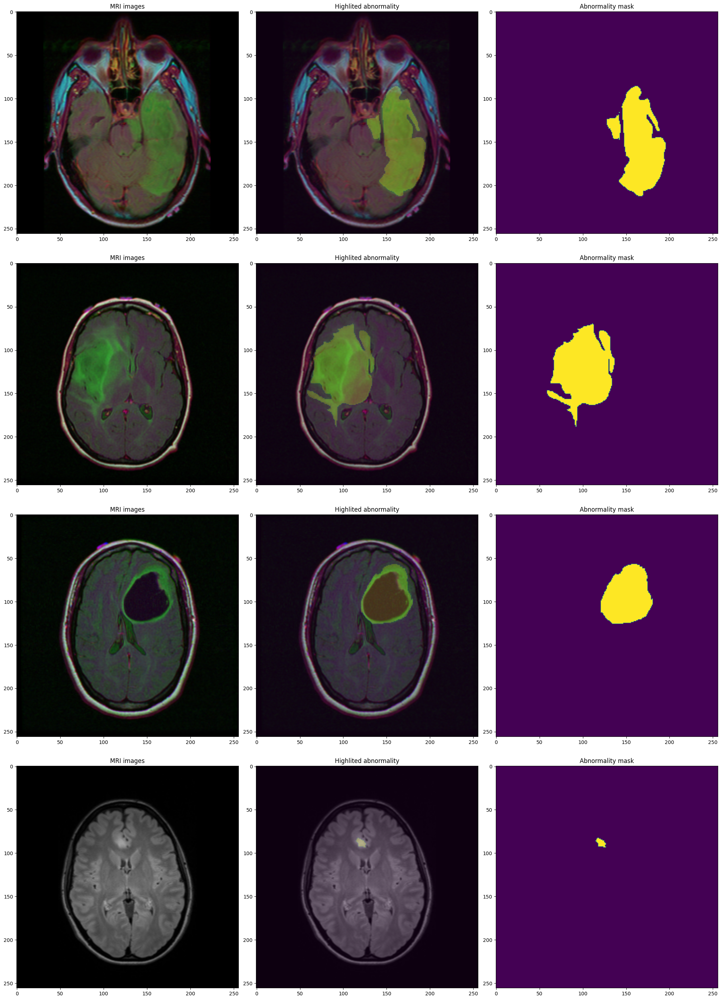

In [21]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask): 
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break

In [22]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience:int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        :param patience: number of epochs of non-decreasing loss before stopping
        :param min_delta: minimum difference between best and new loss that is considered
            an improvement
        :paran weights_path: Path to the file that should store the model's weights
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.
        :param model: model to which the weigths should be loaded
        """
        return model.load_state_dict(torch.load(self.weights_path))

In [23]:
def IOU_torch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))
    
    iou = (intersection + e) / (union + e)
    return iou

def Dice_torch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)


# def calculate_accuracy(predictions: torch.Tensor, labels: torch.Tensor):
#     """Calculates accuracy for binary segmentation."""
#     predictions = torch.where(predictions > 0.5, 1, 0)
#     correct = torch.sum(predictions == labels.byte())
#     total = torch.numel(labels)
#     accuracy = correct.float() / total
#     return accuracy

In [24]:
def BCE_dice(output, target, alpha=0.01):    
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - Dice_torch(output, target).mean()
    return bce + alpha * soft_dice

In [25]:
model = smp.PSPNet(
    encoder_name="resnext50_32x4d",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation='sigmoid',
)
model.to(device);

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 423MB/s]


In [26]:
import time
import torch
from tqdm import tqdm

def calculate_accuracy(predictions, labels):
    predictions = torch.where(predictions > 0.5, 1, 0)
    correct = (predictions == labels).float()
    accuracy = correct.sum() / correct.numel()
    return accuracy

def training_loop(epochs, model, train_loader, valid_loader, test_loader, optimizer, loss_fn, lr_scheduler):
    history = {
        'train_loss': [], 'val_loss': [], 'test_loss': [],
        'train_IoU': [], 'val_IoU': [], 'test_IoU': [],
        'train_dice': [], 'val_dice': [], 'test_dice': [],
        'train_accuracy': [], 'val_accuracy': [], 'test_accuracy': []
    }
    early_stopping = EarlyStopping(patience=7)
    
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        
        # Training Phase
        running_train_loss = 0
        running_train_accuracy = 0
        running_train_IoU = 0
        running_train_dice = 0
        model.train()
        for img, mask in tqdm(train_loader):
            img, mask = img.to(device), mask.to(device)
            optimizer.zero_grad()
            predictions = model(img)
            predictions = predictions.squeeze(1)
            
            loss = loss_fn(predictions, mask)
            running_train_loss += loss.item() * img.size(0)
            
            accuracy = calculate_accuracy(predictions, mask)
            running_train_accuracy += accuracy.item() * img.size(0)
            
            # Calculate training IoU and Dice
            running_train_IoU += IOU_torch(predictions, mask).sum().item()
            running_train_dice += Dice_torch(predictions, mask).sum().item()
            
            loss.backward()
            optimizer.step()
        
        # Validation Phase
        running_valid_loss = 0
        running_valid_accuracy = 0
        running_valid_IoU = 0
        running_valid_dice = 0
        model.eval()
        with torch.no_grad():
            for img, mask in tqdm(valid_loader):
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
                
                accuracy = calculate_accuracy(predictions, mask)
                running_valid_accuracy += accuracy.item() * img.size(0)
                
                # Calculate validation IoU and Dice
                running_valid_IoU += IOU_torch(predictions, mask).sum().item()
                running_valid_dice += Dice_torch(predictions, mask).sum().item()

        # Test Phase
        running_test_loss = 0
        running_test_accuracy = 0
        running_test_IoU = 0
        running_test_dice = 0
        with torch.no_grad():
            for img, mask in tqdm(test_loader):
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                
                loss = loss_fn(predictions, mask)
                running_test_loss += loss.item() * img.size(0)
                
                accuracy = calculate_accuracy(predictions, mask)
                running_test_accuracy += accuracy.item() * img.size(0)
                
                # Calculate test IoU and Dice
                running_test_IoU += IOU_torch(predictions, mask).sum().item()
                running_test_dice += Dice_torch(predictions, mask).sum().item()

        # Calculate averages
        train_loss = running_train_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        test_loss = running_test_loss / len(test_loader.dataset)

        train_dice = running_train_dice / len(train_loader.dataset)
        val_dice = running_valid_dice / len(valid_loader.dataset)
        test_dice = running_test_dice / len(test_loader.dataset)

        train_IoU = running_train_IoU / len(train_loader.dataset)
        val_IoU = running_valid_IoU / len(valid_loader.dataset)
        test_IoU = running_test_IoU / len(test_loader.dataset)

        train_accuracy = running_train_accuracy / len(train_loader.dataset)
        val_accuracy = running_valid_accuracy / len(valid_loader.dataset)
        test_accuracy = running_test_accuracy / len(test_loader.dataset)
        
        # Update history
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['test_loss'].append(test_loss)
        history['train_IoU'].append(train_IoU)
        history['val_IoU'].append(val_IoU)
        history['test_IoU'].append(test_IoU)
        history['train_dice'].append(train_dice)
        history['val_dice'].append(val_dice)
        history['test_dice'].append(test_dice)
        history['train_accuracy'].append(train_accuracy)
        history['val_accuracy'].append(val_accuracy)
        history['test_accuracy'].append(test_accuracy)
        
        # Print metrics
        print(f'Epoch: {epoch}/{epochs} | '
              f'Training loss: {train_loss:.4f} | Validation loss: {val_loss:.4f} | Test loss: {test_loss:.4f} | '
              f'Training IoU: {train_IoU:.4f} | Validation IoU: {val_IoU:.4f} | Test IoU: {test_IoU:.4f} | '
              f'Training Dice: {train_dice:.4f} | Validation Dice: {val_dice:.4f} | Test Dice: {test_dice:.4f} | '
              f'Training accuracy: {train_accuracy:.4f} | Validation accuracy: {val_accuracy:.4f} | Test accuracy: {test_accuracy:.4f}')
        
        # Update learning rate scheduler
        lr_scheduler.step(val_loss)
        
        # Early stopping
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break

    model.eval()
    return history

In [27]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.0001)
epochs = 100

lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

history = training_loop(epochs, model, train_loader, valid_loader, test_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 589/589 [00:17<00:00, 33.40it/s]


Epoch: 1/100 | Training loss: 0.0303 | Validation loss: 0.0145 | Test loss: 0.0153 | Training IoU: 0.7269 | Validation IoU: 0.8031 | Test IoU: 0.7694 | Training Dice: 0.7551 | Validation Dice: 0.8418 | Test Dice: 0.8066 | Training accuracy: 0.9915 | Validation accuracy: 0.9959 | Test accuracy: 0.9958


100%|██████████| 589/589 [00:06<00:00, 94.30it/s]


Epoch: 2/100 | Training loss: 0.0113 | Validation loss: 0.0092 | Test loss: 0.0098 | Training IoU: 0.8159 | Validation IoU: 0.8622 | Test IoU: 0.8421 | Training Dice: 0.8526 | Validation Dice: 0.8978 | Test Dice: 0.8761 | Training accuracy: 0.9964 | Validation accuracy: 0.9970 | Test accuracy: 0.9969


100%|██████████| 589/589 [00:06<00:00, 88.48it/s]


Epoch: 3/100 | Training loss: 0.0087 | Validation loss: 0.0085 | Test loss: 0.0091 | Training IoU: 0.8466 | Validation IoU: 0.8713 | Test IoU: 0.8502 | Training Dice: 0.8823 | Validation Dice: 0.9054 | Test Dice: 0.8821 | Training accuracy: 0.9971 | Validation accuracy: 0.9972 | Test accuracy: 0.9971


100%|██████████| 589/589 [00:06<00:00, 86.84it/s]


Epoch: 4/100 | Training loss: 0.0075 | Validation loss: 0.0074 | Test loss: 0.0077 | Training IoU: 0.8602 | Validation IoU: 0.8881 | Test IoU: 0.8608 | Training Dice: 0.8945 | Validation Dice: 0.9204 | Test Dice: 0.8925 | Training accuracy: 0.9975 | Validation accuracy: 0.9974 | Test accuracy: 0.9975


100%|██████████| 589/589 [00:06<00:00, 92.92it/s]


Epoch: 5/100 | Training loss: 0.0067 | Validation loss: 0.0069 | Test loss: 0.0075 | Training IoU: 0.8709 | Validation IoU: 0.8812 | Test IoU: 0.8622 | Training Dice: 0.9039 | Validation Dice: 0.9129 | Test Dice: 0.8936 | Training accuracy: 0.9977 | Validation accuracy: 0.9976 | Test accuracy: 0.9976


100%|██████████| 589/589 [00:09<00:00, 60.21it/s]


Epoch: 6/100 | Training loss: 0.0060 | Validation loss: 0.0065 | Test loss: 0.0069 | Training IoU: 0.8821 | Validation IoU: 0.8907 | Test IoU: 0.8780 | Training Dice: 0.9145 | Validation Dice: 0.9215 | Test Dice: 0.9096 | Training accuracy: 0.9979 | Validation accuracy: 0.9977 | Test accuracy: 0.9977


100%|██████████| 589/589 [00:10<00:00, 54.22it/s]


Epoch: 7/100 | Training loss: 0.0056 | Validation loss: 0.0073 | Test loss: 0.0078 | Training IoU: 0.8911 | Validation IoU: 0.8819 | Test IoU: 0.8643 | Training Dice: 0.9225 | Validation Dice: 0.9157 | Test Dice: 0.8977 | Training accuracy: 0.9980 | Validation accuracy: 0.9975 | Test accuracy: 0.9975


100%|██████████| 589/589 [00:06<00:00, 96.66it/s] 


Epoch: 8/100 | Training loss: 0.0052 | Validation loss: 0.0066 | Test loss: 0.0074 | Training IoU: 0.8982 | Validation IoU: 0.8966 | Test IoU: 0.8751 | Training Dice: 0.9282 | Validation Dice: 0.9271 | Test Dice: 0.9066 | Training accuracy: 0.9982 | Validation accuracy: 0.9977 | Test accuracy: 0.9976


100%|██████████| 589/589 [00:06<00:00, 89.12it/s]


Epoch: 9/100 | Training loss: 0.0051 | Validation loss: 0.0079 | Test loss: 0.0085 | Training IoU: 0.8969 | Validation IoU: 0.8896 | Test IoU: 0.8648 | Training Dice: 0.9270 | Validation Dice: 0.9220 | Test Dice: 0.8947 | Training accuracy: 0.9982 | Validation accuracy: 0.9975 | Test accuracy: 0.9974


100%|██████████| 589/589 [00:06<00:00, 94.42it/s]


Epoch: 10/100 | Training loss: 0.0043 | Validation loss: 0.0062 | Test loss: 0.0067 | Training IoU: 0.9130 | Validation IoU: 0.9038 | Test IoU: 0.8796 | Training Dice: 0.9409 | Validation Dice: 0.9329 | Test Dice: 0.9100 | Training accuracy: 0.9984 | Validation accuracy: 0.9979 | Test accuracy: 0.9978


100%|██████████| 589/589 [00:06<00:00, 94.46it/s] 


Epoch: 11/100 | Training loss: 0.0040 | Validation loss: 0.0061 | Test loss: 0.0068 | Training IoU: 0.9213 | Validation IoU: 0.9058 | Test IoU: 0.8763 | Training Dice: 0.9485 | Validation Dice: 0.9350 | Test Dice: 0.9064 | Training accuracy: 0.9985 | Validation accuracy: 0.9979 | Test accuracy: 0.9978


100%|██████████| 589/589 [00:06<00:00, 97.69it/s] 


Epoch: 12/100 | Training loss: 0.0039 | Validation loss: 0.0063 | Test loss: 0.0068 | Training IoU: 0.9239 | Validation IoU: 0.9006 | Test IoU: 0.8845 | Training Dice: 0.9508 | Validation Dice: 0.9302 | Test Dice: 0.9148 | Training accuracy: 0.9986 | Validation accuracy: 0.9979 | Test accuracy: 0.9979


100%|██████████| 589/589 [00:06<00:00, 92.50it/s]


Epoch: 13/100 | Training loss: 0.0037 | Validation loss: 0.0062 | Test loss: 0.0068 | Training IoU: 0.9261 | Validation IoU: 0.9048 | Test IoU: 0.8803 | Training Dice: 0.9523 | Validation Dice: 0.9340 | Test Dice: 0.9108 | Training accuracy: 0.9986 | Validation accuracy: 0.9979 | Test accuracy: 0.9978


100%|██████████| 589/589 [00:06<00:00, 92.82it/s]


Epoch: 14/100 | Training loss: 0.0036 | Validation loss: 0.0063 | Test loss: 0.0070 | Training IoU: 0.9304 | Validation IoU: 0.9052 | Test IoU: 0.8843 | Training Dice: 0.9562 | Validation Dice: 0.9349 | Test Dice: 0.9148 | Training accuracy: 0.9987 | Validation accuracy: 0.9979 | Test accuracy: 0.9978


100%|██████████| 589/589 [00:06<00:00, 97.54it/s] 


Epoch: 15/100 | Training loss: 0.0035 | Validation loss: 0.0062 | Test loss: 0.0069 | Training IoU: 0.9327 | Validation IoU: 0.9067 | Test IoU: 0.8834 | Training Dice: 0.9577 | Validation Dice: 0.9360 | Test Dice: 0.9135 | Training accuracy: 0.9987 | Validation accuracy: 0.9979 | Test accuracy: 0.9979


100%|██████████| 589/589 [00:06<00:00, 94.25it/s]


Epoch: 16/100 | Training loss: 0.0034 | Validation loss: 0.0064 | Test loss: 0.0070 | Training IoU: 0.9338 | Validation IoU: 0.9054 | Test IoU: 0.8785 | Training Dice: 0.9589 | Validation Dice: 0.9349 | Test Dice: 0.9088 | Training accuracy: 0.9987 | Validation accuracy: 0.9979 | Test accuracy: 0.9978


100%|██████████| 589/589 [00:06<00:00, 91.32it/s]


Epoch: 17/100 | Training loss: 0.0034 | Validation loss: 0.0063 | Test loss: 0.0070 | Training IoU: 0.9341 | Validation IoU: 0.9054 | Test IoU: 0.8794 | Training Dice: 0.9590 | Validation Dice: 0.9350 | Test Dice: 0.9097 | Training accuracy: 0.9987 | Validation accuracy: 0.9979 | Test accuracy: 0.9978


100%|██████████| 589/589 [00:06<00:00, 87.12it/s] 
/tmp/ipykernel_36/521606653.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return model.load_state_dict(torch.load(s

Epoch: 18/100 | Training loss: 0.0033 | Validation loss: 0.0062 | Test loss: 0.0069 | Training IoU: 0.9352 | Validation IoU: 0.9066 | Test IoU: 0.8844 | Training Dice: 0.9601 | Validation Dice: 0.9360 | Test Dice: 0.9147 | Training accuracy: 0.9987 | Validation accuracy: 0.9979 | Test accuracy: 0.9979


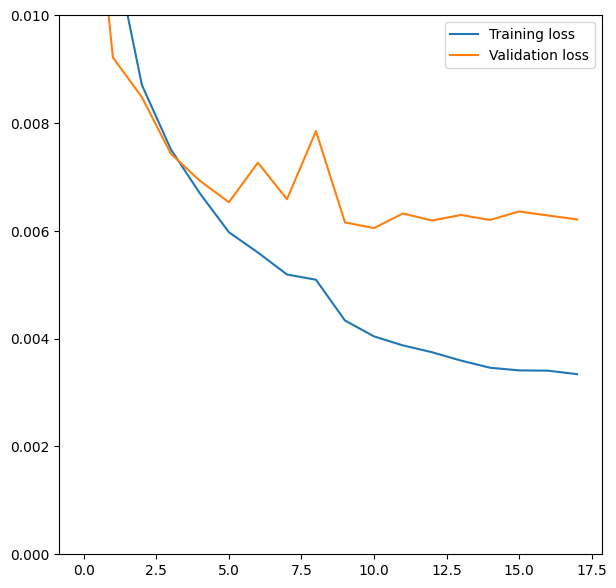

In [28]:
plt.figure(figsize=(7, 7))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, 0.01)
plt.legend()
plt.show()

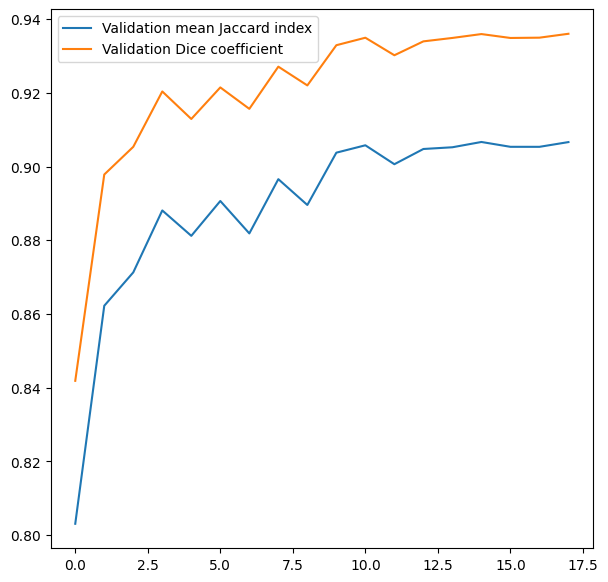

In [29]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()

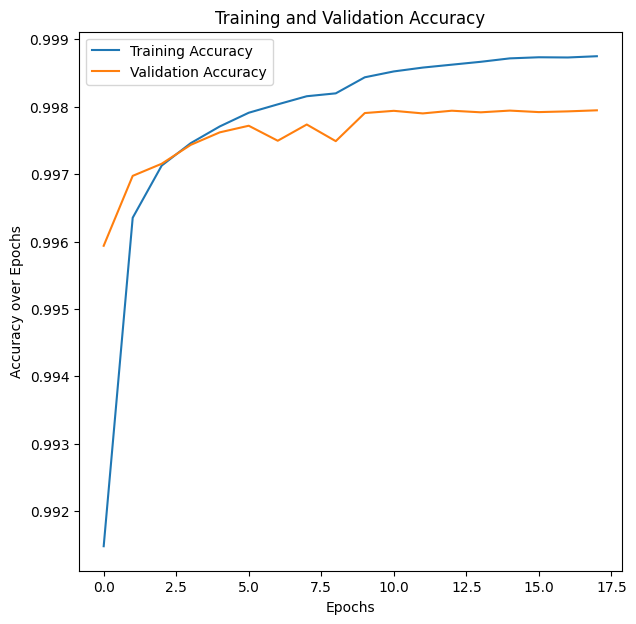

In [30]:
plt.figure(figsize=(7, 7))
plt.plot(history['train_accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy over Epochs')
plt.legend()
plt.show()

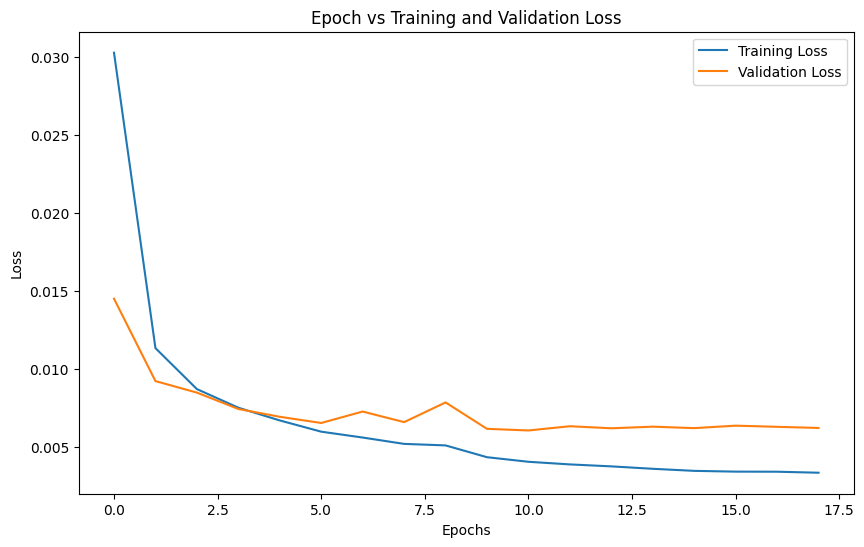

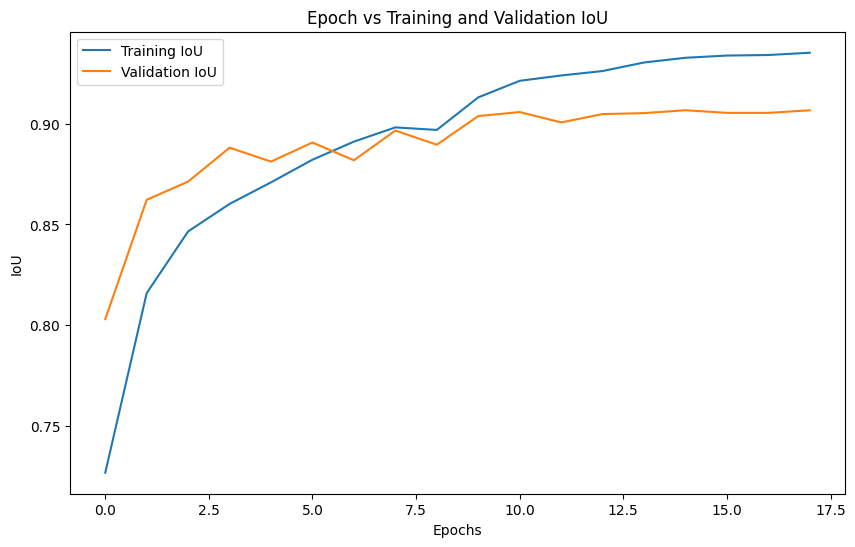

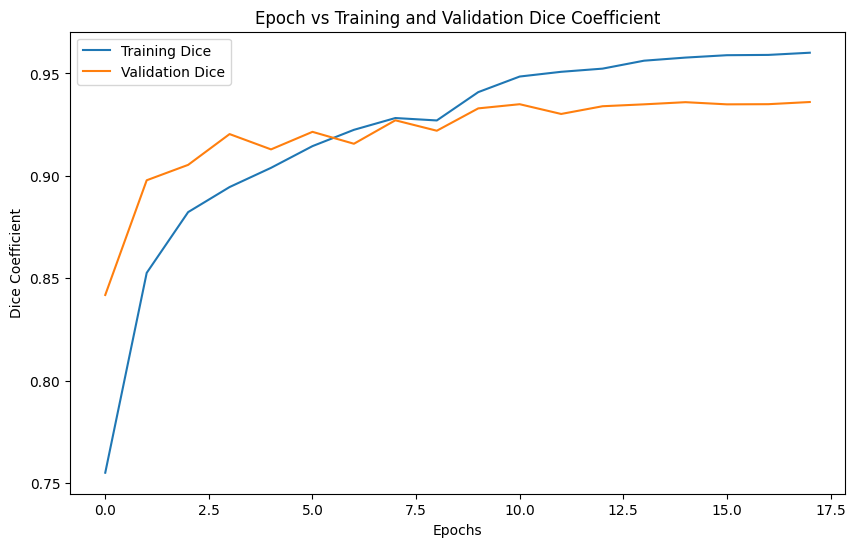

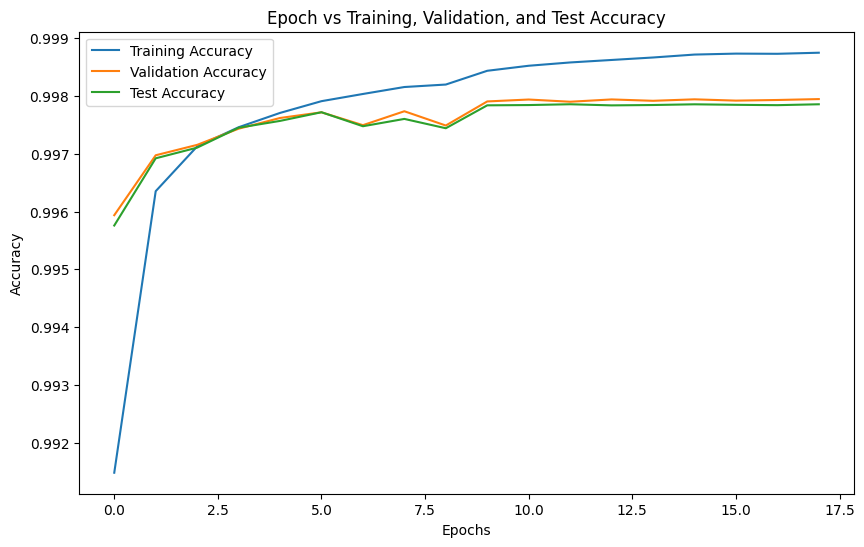

In [31]:
# Plot Training and Validation Loss

# epochs = range(1, len(history['train_loss']) + 1)



plt.figure(figsize=(10, 6))
plt.plot(history['train_loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Epoch vs Training and Validation Loss')
plt.legend()
plt.show()

# Plot Training and Validation IoU
plt.figure(figsize=(10, 6))
plt.plot(history['train_IoU'], label='Training IoU')
plt.plot(history['val_IoU'], label='Validation IoU')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.title('Epoch vs Training and Validation IoU')
plt.legend()
plt.show()

# Plot Training and Validation Dice Coefficient
plt.figure(figsize=(10, 6))
plt.plot(history['train_dice'], label='Training Dice')
plt.plot(history['val_dice'], label='Validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.title('Epoch vs Training and Validation Dice Coefficient')
plt.legend()
plt.show()

# Plot Training, Validation, and Test Accuracy
plt.figure(figsize=(10, 6))
plt.plot(history['train_accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.plot(history['test_accuracy'], label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Epoch vs Training, Validation, and Test Accuracy')
plt.legend()
plt.show()

In [32]:
with torch.no_grad():
    # Initialize running metrics for training, validation, and test sets
    running_train_loss = 0
    running_train_IoU = 0
    running_train_dice = 0
    running_train_accuracy = 0
    
    running_valid_loss = 0
    running_valid_IoU = 0
    running_valid_dice = 0
    running_valid_accuracy = 0
    
    running_test_loss = 0
    running_test_IoU = 0
    running_test_dice = 0
    running_test_accuracy = 0

    # Evaluate on the validation set
    for i, data in enumerate(valid_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        
        running_valid_dice += Dice_torch(predictions, mask).sum().item()
        running_valid_IoU += IOU_torch(predictions, mask).sum().item()
        
        loss = loss_fn(predictions, mask)
        running_valid_loss += loss.item() * img.size(0)
        
        # Calculate accuracy
        accuracy = calculate_accuracy(predictions, mask)
        running_valid_accuracy += accuracy.item() * img.size(0)
    
    # Calculate the validation metrics
    val_loss = running_valid_loss / len(valid_loader.dataset)
    val_dice = running_valid_dice / len(valid_loader.dataset)
    val_IoU = running_valid_IoU / len(valid_loader.dataset)
    val_accuracy = running_valid_accuracy / len(valid_loader.dataset)

    # Calculate the training metrics
    for i, data in enumerate(train_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        
        running_train_dice += Dice_torch(predictions, mask).sum().item()
        running_train_IoU += IOU_torch(predictions, mask).sum().item()
        
        loss = loss_fn(predictions, mask)
        running_train_loss += loss.item() * img.size(0)
        
        # Calculate accuracy
        accuracy = calculate_accuracy(predictions, mask)
        running_train_accuracy += accuracy.item() * img.size(0)
    
    train_loss = running_train_loss / len(train_loader.dataset)
    train_dice = running_train_dice / len(train_loader.dataset)
    train_IoU = running_train_IoU / len(train_loader.dataset)
    train_accuracy = running_train_accuracy / len(train_loader.dataset)

    # Evaluate on the test set
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        
        running_test_dice += Dice_torch(predictions, mask).sum().item()
        running_test_IoU += IOU_torch(predictions, mask).sum().item()
        
        loss = loss_fn(predictions, mask)
        running_test_loss += loss.item() * img.size(0)
        
        # Calculate accuracy
        accuracy = calculate_accuracy(predictions, mask)
        running_test_accuracy += accuracy.item() * img.size(0)
    
    test_loss = running_test_loss / len(test_loader.dataset)
    test_dice = running_test_dice / len(test_loader.dataset)
    test_IoU = running_test_IoU / len(test_loader.dataset)
    test_accuracy = running_test_accuracy / len(test_loader.dataset)

    # Print a summary table
    print("\n Evaluation Summary ".center(150, "+"))
    print(f"Training Loss       : {train_loss:.4f}")
    print(f"Training Accuracy   : {train_accuracy:.4f}%")
    print(f"Training IoU        : {train_IoU:.4f}")
    print(f"Training Dice       : {train_dice:.4f}")
    
    print("\n ".center(150, "*"))
    print(f"Validation Loss     : {val_loss:.4f}")
    print(f"Validation Accuracy : {val_accuracy:.4f}%")
    print(f"Validation IoU      : {val_IoU:.4f}")
    print(f"Validation Dice     : {val_dice:.4f}")
    
    print("\n".center(150, "*"))
    print(f"Test Loss           : {test_loss:.4f}")
    print(f"Test Accuracy       : {test_accuracy:.4f}%")
    print(f"Test IoU            : {test_IoU:.4f}")
    print(f"Test Dice           : {test_dice:.4f}")
    print("==============================\n")

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
 Evaluation Summary +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Training Loss       : 0.0037
Training Accuracy   : 0.9986%
Training IoU        : 0.9294
Training Dice       : 0.9558
**************************************************************************
 **************************************************************************
Validation Loss     : 0.0061
Validation Accuracy : 0.9979%
Validation IoU      : 0.9058
Validation Dice     : 0.9350
**************************************************************************
***************************************************************************
Test Loss           : 0.0068
Test Accuracy       : 0.9978%
Test IoU            : 0.8763
Test Dice           : 0.9064



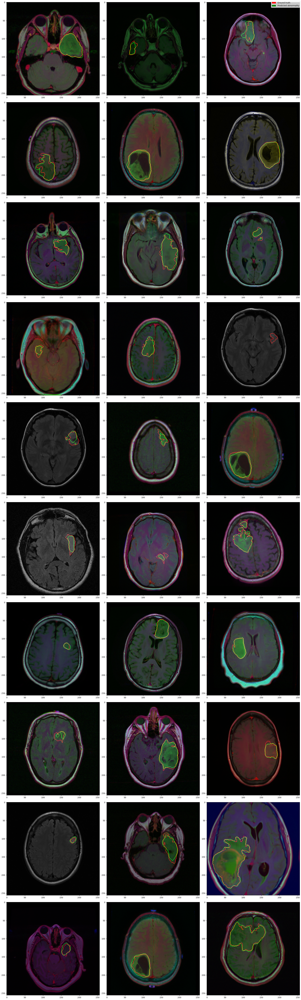

In [33]:
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1
        
        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1

In [34]:
import plotly.graph_objects as go
import plotly.express as px

# Set color themes
colors = px.colors.qualitative.Plotly

# Function to get color with cycling
def get_color(index):
    return colors[index % len(colors)]

# Plot Training, Validation, and Test Loss
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(len(history['train_loss']))), y=history['train_loss'],
                         mode='lines+markers',
                         name='Training Loss',
                         line=dict(color=get_color(0))))
fig.add_trace(go.Scatter(x=list(range(len(history['val_loss']))), y=history['val_loss'],
                         mode='lines+markers',
                         name='Validation Loss',
                         line=dict(color=get_color(1))))
fig.add_trace(go.Scatter(x=list(range(len(history['test_loss']))), y=history['test_loss'],
                         mode='lines+markers',
                         name='Test Loss',
                         line=dict(color=get_color(2))))
fig.update_layout(title='Training, Validation, and Test Loss (PSPNet)',
                  xaxis_title='Epochs',
                  yaxis_title='Loss',
                  template='plotly_dark')
fig.show()

# Plot Training, Validation, and Test IoU
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(len(history['train_IoU']))), y=history['train_IoU'],
                         mode='lines+markers',
                         name='Training IoU',
                         line=dict(color=get_color(3))))
fig.add_trace(go.Scatter(x=list(range(len(history['val_IoU']))), y=history['val_IoU'],
                         mode='lines+markers',
                         name='Validation IoU',
                         line=dict(color=get_color(4))))
fig.add_trace(go.Scatter(x=list(range(len(history['test_IoU']))), y=history['test_IoU'],
                         mode='lines+markers',
                         name='Test IoU',
                         line=dict(color=get_color(5))))
fig.update_layout(title='Training, Validation, and Test IoU (PSPNet)',
                  xaxis_title='Epochs',
                  yaxis_title='IoU',
                  template='plotly_dark')
fig.show()

# Plot Training, Validation, and Test Dice Coefficient
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(len(history['train_dice']))), y=history['train_dice'],
                         mode='lines+markers',
                         name='Training Dice Coefficient',
                         line=dict(color=get_color(6))))
fig.add_trace(go.Scatter(x=list(range(len(history['val_dice']))), y=history['val_dice'],
                         mode='lines+markers',
                         name='Validation Dice Coefficient',
                         line=dict(color=get_color(7))))
fig.add_trace(go.Scatter(x=list(range(len(history['test_dice']))), y=history['test_dice'],
                         mode='lines+markers',
                         name='Test Dice Coefficient',
                         line=dict(color=get_color(8))))
fig.update_layout(title='Training, Validation, and Test Dice Coefficient (PSPNet)',
                  xaxis_title='Epochs',
                  yaxis_title='Dice Coefficient',
                  template='plotly_dark')
fig.show()

# Plot Training, Validation, and Test Accuracy
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(len(history['train_accuracy']))), y=history['train_accuracy'],
                         mode='lines+markers',
                         name='Training Accuracy',
                         line=dict(color=get_color(9))))
fig.add_trace(go.Scatter(x=list(range(len(history['val_accuracy']))), y=history['val_accuracy'],
                         mode='lines+markers',
                         name='Validation Accuracy',
                         line=dict(color=get_color(10))))
fig.add_trace(go.Scatter(x=list(range(len(history['test_accuracy']))), y=history['test_accuracy'],
                         mode='lines+markers',
                         name='Test Accuracy',
                         line=dict(color=get_color(11))))
fig.update_layout(title='Training, Validation, and Test Accuracy (PSPNet)',
                  xaxis_title='Epochs',
                  yaxis_title='Accuracy',
                  template='plotly_dark')
fig.show()

In [35]:
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score
import plotly.figure_factory as ff
import plotly.graph_objects as go

# Set the model to evaluation mode
model.eval()

# Initialize lists to store predictions and true labels
preds = []
true_labels = []

# Disable gradient calculation for inference
with torch.no_grad():
    for img, mask in test_loader:
        img, mask = img.to(device), mask.to(device)
        outputs = model(img)
        predictions = torch.where(outputs.squeeze(1) > 0.5, 1, 0)
        preds.extend(predictions.cpu().numpy().flatten())
        true_labels.extend(mask.cpu().numpy().flatten())

# Convert lists to numpy arrays
preds = np.array(preds)
true_labels = np.array(true_labels)

# Calculate confusion matrix
cm = confusion_matrix(true_labels, preds)

# Calculate class-wise F1 score
f1 = f1_score(true_labels, preds, average=None)

# Print F1 scores
print("Class-wise F1 score:")
print(f1)

# Plot confusion matrix using Plotly
fig = ff.create_annotated_heatmap(cm, colorscale='Blues', x=['Class 0', 'Class 1'],
                                  y=['Class 0', 'Class 1'], showscale=True)

# Add titles and labels
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted label',
                  yaxis_title='True label')

# Show the confusion matrix plot
fig.show()

# Plot F1 scores using Plotly
fig_f1 = go.Figure(data=[go.Bar(x=['Class 0', 'Class 1'], y=f1, marker_color='blue')])

# Add titles and labels
fig_f1.update_layout(title='Class-wise F1 Scores',
                     xaxis_title='Class',
                     yaxis_title='F1 Score')

# Show the F1 score plot
fig_f1.show()


Class-wise F1 score:
[0.99891074 0.89537901]


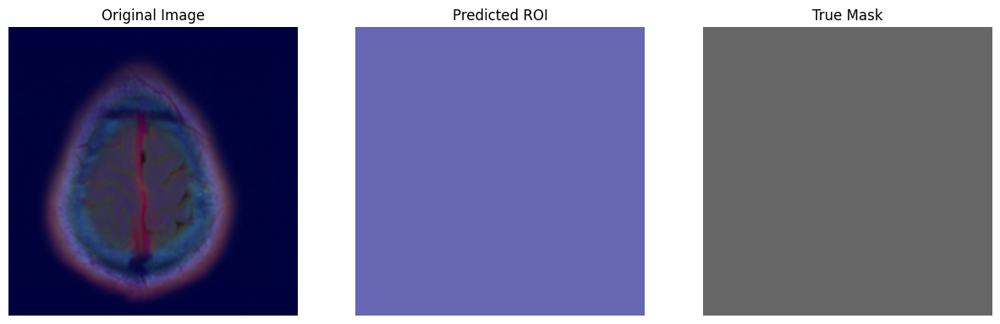

In [36]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def visualize_roi(img, predicted_mask, true_mask=None, threshold=0.5):
    """
    Visualize the region of interest (ROI) in the predicted mask.

    Parameters:
    - img: The input image (as a tensor or numpy array).
    - predicted_mask: The predicted mask by the model (as a tensor).
    - true_mask: The ground truth mask (as a tensor), optional.
    - threshold: The threshold to apply to the predicted mask to create the binary ROI.

    Returns:
    - Displays the original image, predicted mask, and optionally the true mask.
    """
    # Convert tensors to numpy arrays if needed
    if isinstance(img, torch.Tensor):
        img = img.cpu().numpy().transpose(1, 2, 0)
    if isinstance(predicted_mask, torch.Tensor):
        predicted_mask = predicted_mask.cpu().numpy()
    if true_mask is not None and isinstance(true_mask, torch.Tensor):
        true_mask = true_mask.cpu().numpy()

    # Apply threshold to create a binary mask for ROI
    roi = predicted_mask > threshold

    # Plot the original image
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    # Plot the predicted mask (as ROI)
    plt.subplot(1, 3, 2)
    plt.imshow(roi, cmap='jet', alpha=0.6)
    plt.title('Predicted ROI')
    plt.axis('off')

    # If true mask is provided, plot it
    if true_mask is not None:
        plt.subplot(1, 3, 3)
        plt.imshow(true_mask, cmap='gray', alpha=0.6)
        plt.title('True Mask')
        plt.axis('off')

    plt.show()

# Example usage within your existing code
# Assuming `img`, `predictions`, and `mask` are obtained during the test phase
model.eval()
with torch.no_grad():
    for img, mask in test_loader:
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        
        # Visualize the ROI on the first image in the batch
        visualize_roi(img[0], predictions[0], mask[0])
        break  # Only visualize the first batch for example purposes


In [37]:
# import torch
# import numpy as np
# import matplotlib.pyplot as plt
# import cv2
# from torchvision import transforms

# # Define a normalization transform
# inv_normalize = transforms.Normalize(
#     mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
#     std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
# )

# # Define a hook to capture gradients and activations
# class SaveFeatures:
#     def __init__(self, module):
#         self.features = None
#         self.gradients = None
#         self.hook_forward = module.register_forward_hook(self.forward_hook)
#         self.hook_backward = module.register_backward_hook(self.backward_hook)

#     def forward_hook(self, module, input, output):
#         self.features = output

#     def backward_hook(self, module, grad_in, grad_out):
#         self.gradients = grad_out[0]
#         print(f"Captured gradients with shape: {self.gradients.shape}")

#     def close(self):
#         self.hook_forward.remove()
#         self.hook_backward.remove()

# # Function to generate Grad-CAM
# def generate_gradcam(img, model, target_layer):
#     # Set model to evaluation mode
#     model.eval()

#     # Hook the target layer to save gradients and activations
#     features = SaveFeatures(target_layer)

#     # Forward pass
#     img = img.to(device)
#     output = model(img)
#     output = output.squeeze(1)

#     # Compute the loss (use a dummy mask of the same size as the output)
#     loss = output.mean()  # You may want to modify this depending on the task

#     # Backward pass to get gradients
#     model.zero_grad()
#     loss.backward()

#     # Get the gradients from the hooked layer
#     gradients = features.gradients

#     # Check if gradients are None
#     if gradients is None:
#         raise RuntimeError("Gradients were not captured. Check the backward hook.")

#     # Pool the gradients across the channels
#     pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

#     # Get the activations of the target convolutional layer
#     activations = features.features.detach()

#     # Weight the channels by corresponding gradients
#     for i in range(pooled_gradients.size(0)):
#         activations[:, i, :, :] *= pooled_gradients[i]

#     # Average the channels of the activations
#     heatmap = torch.mean(activations, dim=1).squeeze().cpu()

#     # Apply ReLU to the heatmap
#     heatmap = np.maximum(heatmap, 0)

#     # Normalize the heatmap
#     heatmap /= torch.max(heatmap)

#     return heatmap

# # Apply Grad-CAM on a batch of images
# def apply_gradcam_to_batch(model, dataloader, target_layer, num_images=10):
#     fig, ax = plt.subplots(nrows=num_images, ncols=2, figsize=(10, num_images * 5))

#     for i in range(num_images):
#         img, target = next(iter(dataloader))
#         heatmap = generate_gradcam(img, model, target_layer)

#         # Resize heatmap to match the input image
#         heatmap = cv2.resize(np.float32(heatmap), (img.size(2), img.size(3)))
#         heatmap = np.uint8(255 * heatmap)
#         heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

#         # Superimpose the heatmap on the original image
#         original_img = inv_normalize(img[0]).permute(1, 2, 0).cpu().numpy()
#         superimposed_img = heatmap * 0.4 + original_img

#         # Plot heatmap and original image
#         ax[i, 0].imshow(superimposed_img)
#         ax[i, 0].set_title("Grad-CAM")
#         ax[i, 1].imshow(original_img)
#         ax[i, 1].set_title("Original Image")

#     plt.tight_layout()
#     plt.show()

# # Assuming the target layer is the last convolutional layer of the ResNet encoder
# target_layer = model.encoder.layer4[-1].conv3

# # Apply Grad-CAM
# apply_gradcam_to_batch(model, test_loader, target_layer, num_images=2)
